### Introduction

In this notebook, I extracted the top keywords for news articles under each HDB town

References:
- https://towardsdatascience.com/keyword-extraction-python-tf-idf-textrank-topicrank-yake-bert-7405d51cd839

In [1]:
import pandas as pd
import ast
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import yake
import matplotlib.pyplot as plt
from wordcloud import WordCloud

keyword_extractor = yake.KeywordExtractor(n=1, dedupLim=0.9, dedupFunc='seqm', top=10, )

In [2]:
df = pd.read_csv('straitstimes_articles_processed.csv')
df['Article Processed'] = df['Article Processed'].apply(ast.literal_eval)
df

,Published Date,Published Date (Standardised),Title,Article,Links,Published Year,Category,Town Involved,Title Processed,Article Processed
0,"January 2, 2013 at 7:49 PM",2013-01-02,Teo Ho Pin: Contract with AIM benefits town co...,The PAP town councils sold the management soft...,https://www.straitstimes.com/singapore/teo-ho-...,2013,NaN,Hougang,"['teo', 'ho', 'pin', 'contract', 'aim', 'benef...","[pap, town, council, sell, management, softwar..."
1,"January 2, 2013 at 5:10 PM",2013-01-02,Man jailed for punching friend's boyfriend,A salesman was jailed on Wednesday for a month...,https://www.straitstimes.com/singapore/man-jai...,2013,NaN,Punggol,"['man', 'jail', 'punch', 'friend', 'boyfriend']","[salesman, jail, wednesday, month, punch, 20, ..."
2,"January 2, 2013 at 11:09 AM",2013-01-02,"Man jailed, fined and banned over fatal accident",A truck driver who failed to help a severely i...,https://www.straitstimes.com/singapore/man-jai...,2013,NaN,Ang mo kio,"['man', 'jail', 'fin', 'ban', 'fatal', 'accide...","[truck, driver, fail, help, severely, injured,..."
3,"January 3, 2013 at 5:39 PM",2013-01-03,Money mule jailed 4 1/2 years for laundering $...,"In April, US$2.7 million (S$3.3 million) was d...",https://www.straitstimes.com/singapore/money-m...,2013,NaN,Punggol,"['money', 'mule', 'jail', '4', '1', '2', 'year...","[april, us, 2, 7, million, 3, 3, million, draw..."
4,"January 3, 2013 at 5:37 PM",2013-01-03,Two men found hiding in car boot arrested for ...,Two Indian nationals have been arrested for tr...,https://www.straitstimes.com/singapore/two-men...,2013,NaN,Woodlands,"['two', 'men', 'find', 'hiding', 'car', 'boot'...","[two, indian, national, arrest, try, slip, imm..."
...,...,...,...,...,...,...,...,...,...,...
5456,"October 4, 2023 at 7:16 PM",2023-10-04,Parliament debates on what constitutes basic n...,SINGAPORE - MPs debated what constitutes basic...,https://www.straitstimes.com/singapore/politic...,2023,politics,Sengkang,"['parliament', 'debate', 'constitute', 'basic'...","[singapore, mp, debate, constitute, basic, nee..."
5457,"October 4, 2023 at 6:30 PM",2023-10-04,Workers’ Party’s Louis Chua seeks to enshrine ...,SINGAPORE - Enshrining flexible work arrangeme...,https://www.straitstimes.com/singapore/politic...,2023,politics,Sengkang,"['worker', 'party', 'louis', 'chua', 'seek', '...","[singapore, enshrine, flexible, work, arrangem..."
5458,"October 25, 2023 at 11:05 AM",2023-10-25,$2.6b project to refresh Singapore’s oldest MR...,SINGAPORE – A $2.6 billion programme to renew ...,https://www.straitstimes.com/singapore/transpo...,2023,transport,Bishan,"['2', '6b', 'project', 'refresh', 'singapore',...","[singapore, 2, 6, billion, programme, renew, n..."
5459,"October 25, 2023 at 3:45 PM",2023-10-25,"Porsche, 2 Rolls-Royces among 4 cars seized fr...",SINGAPORE – Four luxury cars linked to Singapo...,https://www.straitstimes.com/singapore/courts-...,2023,courts-crime,Bukit timah,"['porsche', '2', 'rolls', 'royces', 'among', '...","[singapore, four, luxury, car, link, singapore..."


In [3]:
df['Town Involved Tokens'] = df['Town Involved'].apply(lambda x: x.lower().split())
df['Article Processed'] = df.apply(lambda row: " ".join([word for word in row['Article Processed'] if word not in row['Town Involved Tokens']]), axis=1)
df

,Published Date,Published Date (Standardised),Title,Article,Links,Published Year,Category,Town Involved,Title Processed,Article Processed,Town Involved Tokens
0,"January 2, 2013 at 7:49 PM",2013-01-02,Teo Ho Pin: Contract with AIM benefits town co...,The PAP town councils sold the management soft...,https://www.straitstimes.com/singapore/teo-ho-...,2013,NaN,Hougang,"['teo', 'ho', 'pin', 'contract', 'aim', 'benef...",pap town council sell management software thir...,[hougang]
1,"January 2, 2013 at 5:10 PM",2013-01-02,Man jailed for punching friend's boyfriend,A salesman was jailed on Wednesday for a month...,https://www.straitstimes.com/singapore/man-jai...,2013,NaN,Punggol,"['man', 'jail', 'punch', 'friend', 'boyfriend']",salesman jail wednesday month punch 20 year ol...,[punggol]
2,"January 2, 2013 at 11:09 AM",2013-01-02,"Man jailed, fined and banned over fatal accident",A truck driver who failed to help a severely i...,https://www.straitstimes.com/singapore/man-jai...,2013,NaN,Ang mo kio,"['man', 'jail', 'fin', 'ban', 'fatal', 'accide...",truck driver fail help severely injured pedest...,"[ang, mo, kio]"
3,"January 3, 2013 at 5:39 PM",2013-01-03,Money mule jailed 4 1/2 years for laundering $...,"In April, US$2.7 million (S$3.3 million) was d...",https://www.straitstimes.com/singapore/money-m...,2013,NaN,Punggol,"['money', 'mule', 'jail', '4', '1', '2', 'year...",april us 2 7 million 3 3 million draw account ...,[punggol]
4,"January 3, 2013 at 5:37 PM",2013-01-03,Two men found hiding in car boot arrested for ...,Two Indian nationals have been arrested for tr...,https://www.straitstimes.com/singapore/two-men...,2013,NaN,Woodlands,"['two', 'men', 'find', 'hiding', 'car', 'boot'...",two indian national arrest try slip immigratio...,[woodlands]
...,...,...,...,...,...,...,...,...,...,...,...
5456,"October 4, 2023 at 7:16 PM",2023-10-04,Parliament debates on what constitutes basic n...,SINGAPORE - MPs debated what constitutes basic...,https://www.straitstimes.com/singapore/politic...,2023,politics,Sengkang,"['parliament', 'debate', 'constitute', 'basic'...",singapore mp debate constitute basic need parl...,[sengkang]
5457,"October 4, 2023 at 6:30 PM",2023-10-04,Workers’ Party’s Louis Chua seeks to enshrine ...,SINGAPORE - Enshrining flexible work arrangeme...,https://www.straitstimes.com/singapore/politic...,2023,politics,Sengkang,"['worker', 'party', 'louis', 'chua', 'seek', '...",singapore enshrine flexible work arrangement f...,[sengkang]
5458,"October 25, 2023 at 11:05 AM",2023-10-25,$2.6b project to refresh Singapore’s oldest MR...,SINGAPORE – A $2.6 billion programme to renew ...,https://www.straitstimes.com/singapore/transpo...,2023,transport,Bishan,"['2', '6b', 'project', 'refresh', 'singapore',...",singapore 2 6 billion programme renew north so...,[bishan]
5459,"October 25, 2023 at 3:45 PM",2023-10-25,"Porsche, 2 Rolls-Royces among 4 cars seized fr...",SINGAPORE – Four luxury cars linked to Singapo...,https://www.straitstimes.com/singapore/courts-...,2023,courts-crime,Bukit timah,"['porsche', '2', 'rolls', 'royces', 'among', '...",singapore four luxury car link singapore bad m...,"[bukit, timah]"


In [4]:
town_words = df[['Town Involved', 'Article Processed']].groupby('Town Involved')['Article Processed'].agg(' '.join).reset_index()
town_words

,Town Involved,Article Processed
0,Ang mo kio,truck driver fail help severely injured pedest...
1,Bedok,try sell fake gold ingot laugh buddha elderly ...
2,Bishan,land transport authority intend peg maximum pe...
3,Bukit batok,police arrest six male bangladeshi thursday co...
4,Bukit merah,nine year old lauren yeo burst sing ave maria ...
5,Bukit panjang,man believe use another person credit card pay...
6,Bukit timah,four day stand ms darinne ko step witness tues...
7,Central area,eight year durai scandal national kidney found...
8,Choa chu kang,two men charge separately friday molestation p...
9,Clementi,seat mrt open need multi purpose wand reduce a...


### Top Keywords by Word Count

In [5]:
top_count_keywords = pd.DataFrame(columns=['Town', 'Top Count Keywords'])

In [6]:
count_vectorizer = CountVectorizer(max_df = 0.9)
count_matrix = count_vectorizer.fit_transform(town_words['Article Processed'])
count_feature_names = count_vectorizer.get_feature_names_out()

In [7]:
n = 10

for i, article in enumerate(town_words['Article Processed']):
    word_counts = count_matrix[i, :].toarray()[0]
    top_keywords = [count_feature_names[index] for index in word_counts.argsort()[-n:][::-1]]
    top_counts = [word_counts[index] for index in word_counts.argsort()[-n:][::-1]]
    count_dict = {}
    for j in range(n):
        count_dict[top_keywords[j]] = top_counts[j]
    top_count_keywords = pd.concat([top_count_keywords, pd.DataFrame({'Town': [town_words.iloc[i]['Town Involved']], 'Top Count Keywords': [count_dict]})]).reset_index(drop=True)

In [8]:
top_count_keywords

,Town,Top Count Keywords
0,Ang mo kio,"{'grc': 128, 'vaccination': 122, 'yew': 107, '..."
1,Bedok,"{'reservoir': 68, 'coast': 64, 'hawker': 53, '..."
2,Bishan,"{'smrt': 89, 'maintenance': 40, 'depot': 39, '..."
3,Bukit batok,"{'rat': 115, 'pest': 55, 'dog': 48, 'rodent': ..."
4,Bukit merah,"{'jalan': 45, 'stall': 32, 'hawker': 32, 'paga..."
5,Bukit panjang,"{'smrt': 86, 'singtel': 68, 'rail': 40, 'lrt':..."
6,Bukit timah,"{'grc': 81, 'reserve': 79, 'monkey': 74, 'holl..."
7,Central area,"{'flood': 22, 'ft': 13, 'pas': 12, 'starhub': ..."
8,Choa chu kang,"{'dog': 46, 'claim': 36, 'sra': 34, 'transfer'..."
9,Clementi,"{'accident': 55, 'flood': 54, 'sim': 42, 'hawk..."


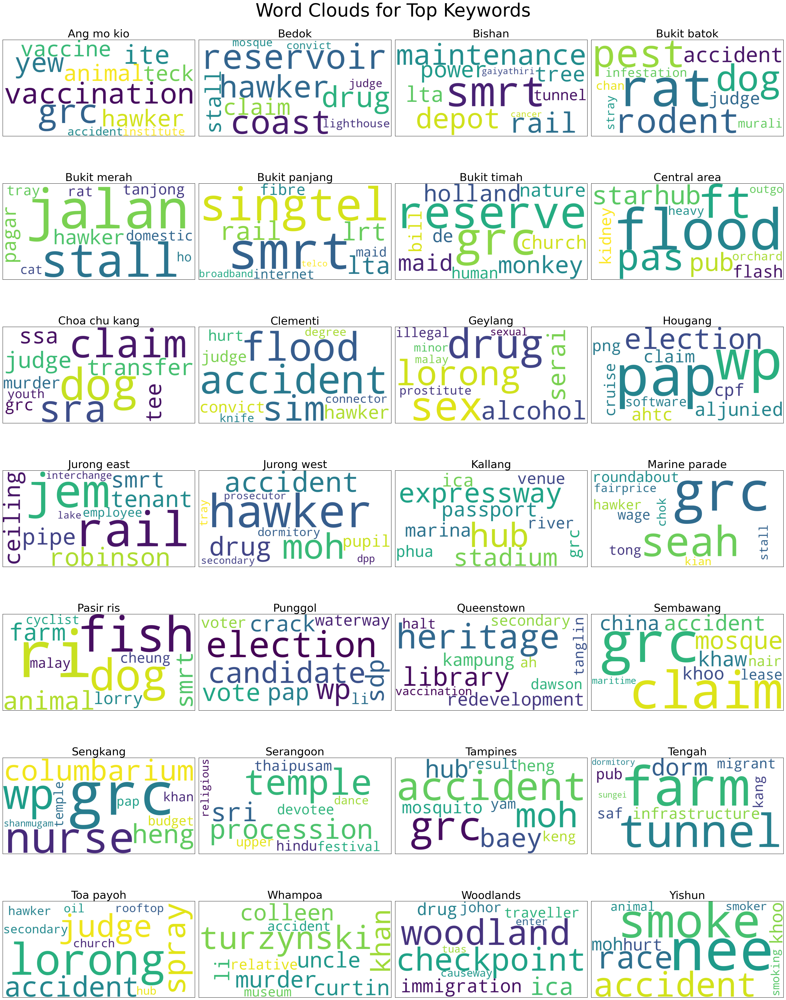

In [9]:
fig, axes = plt.subplots(len(top_count_keywords) // 4, 4, figsize=(30, 40))

for i, ax in enumerate(axes.flat):
    if i < len(top_count_keywords):
        word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_count_keywords.loc[i, 'Top Count Keywords'])
        ax.imshow(word_cloud, interpolation='bilinear')
        ax.set_title(top_count_keywords.loc[i, 'Town'], fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Word Clouds for Top Keywords", fontsize=50)

plt.tight_layout();

### Top Keywords by TF-IDF

In [10]:
top_tfidf_keywords = pd.DataFrame(columns=['Town', 'Top TF-IDF Keywords'])

In [11]:
tfidf_vectorizer = TfidfVectorizer(max_df = 0.9)
tfidf_matrix = tfidf_vectorizer.fit_transform(town_words['Article Processed'])
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()

In [12]:
n = 10

for i, article in enumerate(town_words['Article Processed']):
    word_tfidf = tfidf_matrix[i, :].toarray()[0]
    top_keywords = [tfidf_feature_names[index] for index in word_tfidf.argsort()[::-1][:n]]
    top_tfidf = [word_tfidf[index] for index in word_tfidf.argsort()[::-1][:n]]
    tfidf_dict = {}
    for j in range(n):
        tfidf_dict[top_keywords[j]] = top_tfidf[j]
    top_tfidf_keywords = pd.concat([top_tfidf_keywords, pd.DataFrame({'Town': [town_words.iloc[i]['Town Involved']], 'Top TF-IDF Keywords': [tfidf_dict]})]).reset_index(drop=True)

In [13]:
top_tfidf_keywords

,Town,Top TF-IDF Keywords
0,Ang mo kio,"{'ite': 0.16734021431828136, 'grc': 0.14761736..."
1,Bedok,"{'lighthouse': 0.1787970022317765, 'cfc': 0.17..."
2,Bishan,"{'smrt': 0.2455797639544566, 'gaiyathiri': 0.2..."
3,Bukit batok,"{'rat': 0.3647662569454056, 'rodent': 0.203406..."
4,Bukit merah,"{'bakhtiyar': 0.19882933571849382, 'jalan': 0...."
5,Bukit panjang,"{'lrt': 0.2803731042603786, 'singtel': 0.27908..."
6,Bukit timah,"{'monkey': 0.22686805243076005, 'souza': 0.223..."
7,Central area,"{'flood': 0.3560252980951975, 'nkf': 0.2699197..."
8,Choa chu kang,"{'sra': 0.285882309855532, 'ssa': 0.2186158840..."
9,Clementi,"{'postpal': 0.15642213905446825, 'flood': 0.14..."


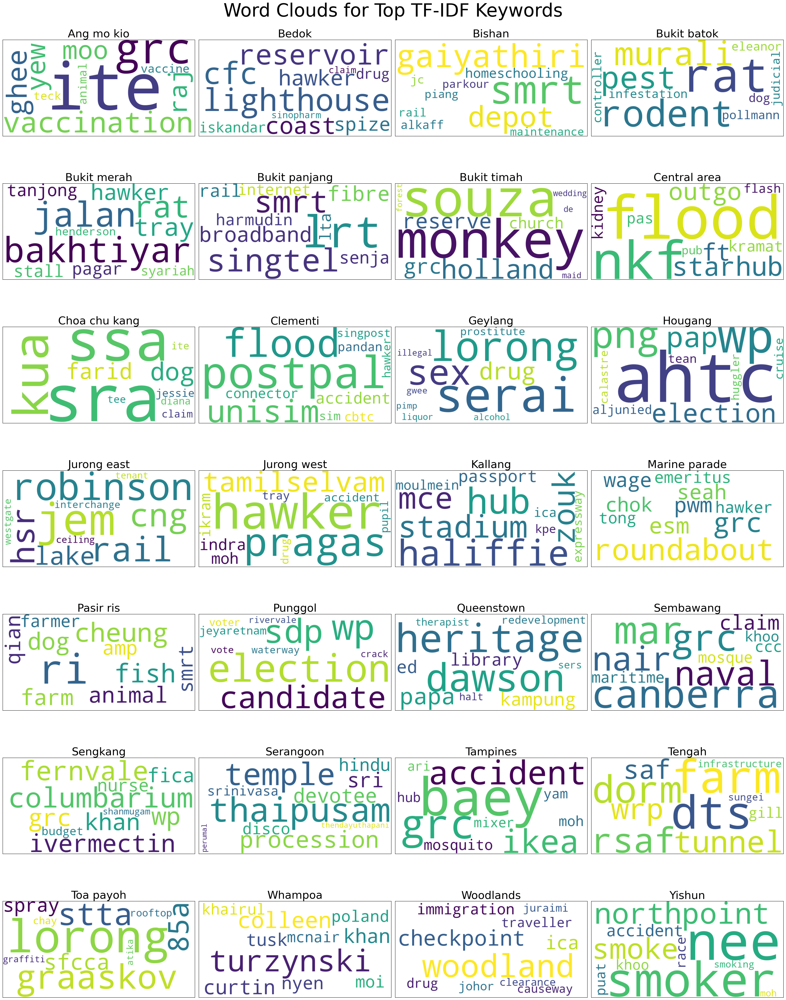

In [14]:
fig, axes = plt.subplots(len(top_tfidf_keywords) // 4, 4, figsize=(30, 40))

for i, ax in enumerate(axes.flat):
    if i < len(top_tfidf_keywords):
        word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_tfidf_keywords.loc[i, 'Top TF-IDF Keywords'])
        ax.imshow(word_cloud, interpolation='bilinear')
        ax.set_title(top_tfidf_keywords.loc[i, 'Town'], fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Word Clouds for Top TF-IDF Keywords", fontsize=50)

plt.tight_layout();

### YAKE

In [15]:
top_yake_keywords = pd.DataFrame(columns=['Town', 'Top YAKE Keywords'])

In [16]:
n = 10

for i, article in enumerate(town_words['Article Processed']):
    keywords = keyword_extractor.extract_keywords(town_words.loc[i, 'Article Processed'])
    yake_dict = {}
    for keyword, score in keywords[::-1][:n]:
        yake_dict[keyword] = score
    top_yake_keywords = pd.concat([top_yake_keywords, pd.DataFrame({'Town': [town_words.iloc[i]['Town Involved']], 'Top YAKE Keywords': [yake_dict]})]).reset_index(drop=True)

In [17]:
top_yake_keywords

,Town,Top YAKE Keywords
0,Ang mo kio,"{'centre': 6.0246019882789594e-05, 'work': 6.0..."
1,Bedok,"{'road': 0.00010220780544796251, 'work': 9.768..."
2,Bishan,"{'system': 0.000294682340506522, 'find': 0.000..."
3,Bukit batok,"{'work': 0.00024343967001909947, 'resident': 0..."
4,Bukit merah,"{'home': 0.00044098672742705916, 'food': 0.000..."
5,Bukit panjang,"{'singtel': 0.00033431773886968694, 'add': 0.0..."
6,Bukit timah,"{'national': 0.00011481806119406792, 'lee': 0...."
7,Central area,"{'million': 0.003186785708726335, 'room': 0.00..."
8,Choa chu kang,"{'man': 0.0002685099631497491, 'give': 0.00026..."
9,Clementi,"{'home': 0.00021018505652737297, 'man': 0.0001..."


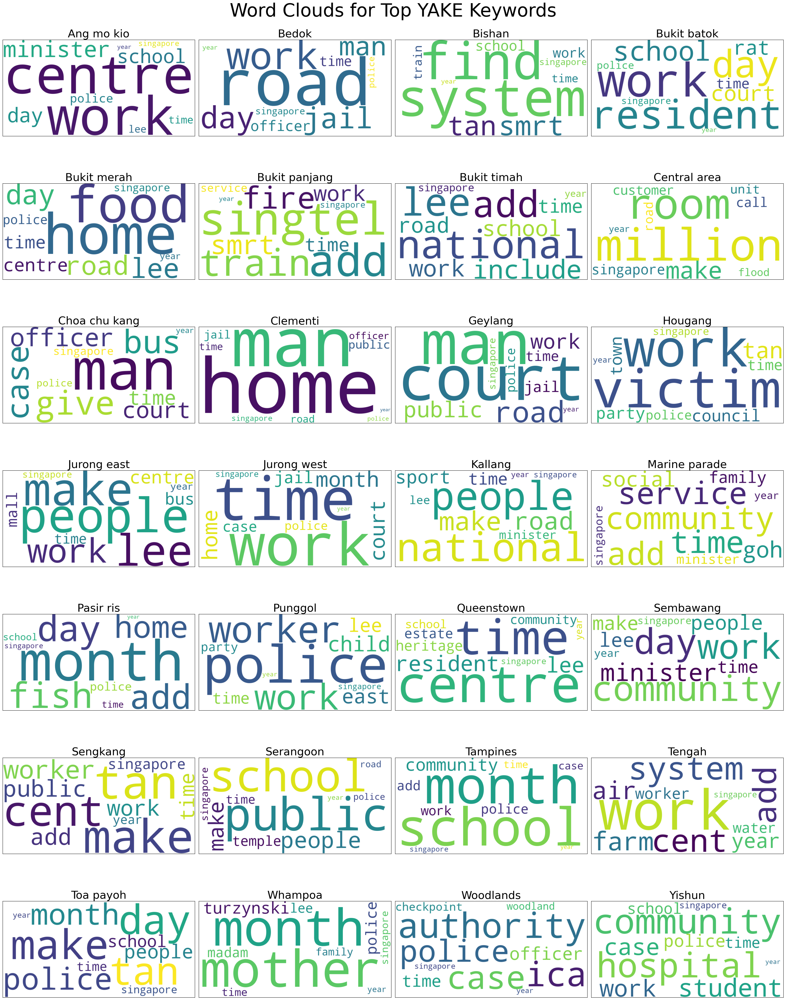

In [18]:
fig, axes = plt.subplots(len(top_yake_keywords) // 4, 4, figsize=(30, 40))

for i, ax in enumerate(axes.flat):
    if i < len(top_yake_keywords):
        word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_yake_keywords.loc[i, 'Top YAKE Keywords'])
        ax.imshow(word_cloud, interpolation='bilinear')
        ax.set_title(top_yake_keywords.loc[i, 'Town'], fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Word Clouds for Top YAKE Keywords", fontsize=50)

plt.tight_layout();

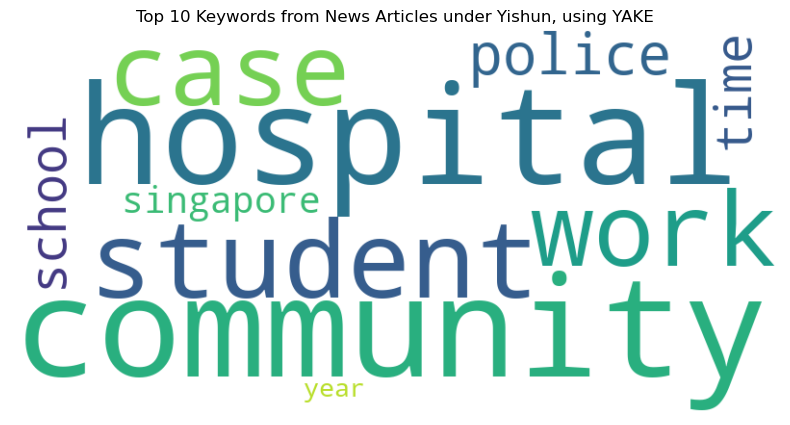

In [19]:
word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_yake_keywords.loc[27, 'Top YAKE Keywords'])
plt.figure(figsize=(10, 5))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.title("Top 10 Keywords from News Articles under Yishun, using YAKE");

### Explore by Article Category

In [20]:
category_words = df[['Category', 'Article Processed']].groupby('Category')['Article Processed'].agg(' '.join).reset_index()
category_words

,Category,Article Processed
0,community,singapore 45 000 people low income family soon...
1,consumer,singapore robinson announce friday morning oct...
2,courts-crime,town council website hack monday second people...
3,education,fifteen government run kindergarten set next t...
4,environment,last year mp grc mr alex yam nearly hit blende...
5,health,construction way new 10 storey community hospi...
6,housing,madam lee say moi 66 still bed last monday mor...
7,jobs,singapore work home circuit breaker last april...
8,manpower,singapore react hit tray scold socialite nancy...
9,parenting-education,singapore professional manager executive pmes ...


**TF-IDF**

In [21]:
top_tfidf_keywords_category = pd.DataFrame(columns=['Category', 'Top TF-IDF Keywords'])

In [22]:
tfidf_vectorizer_category = TfidfVectorizer(max_df = 0.9)
tfidf_matrix_category = tfidf_vectorizer_category.fit_transform(category_words['Article Processed'])
tfidf_feature_names_category = tfidf_vectorizer_category.get_feature_names_out()

In [23]:
n = 10

for i, article in enumerate(category_words['Article Processed']):
    word_tfidf_category = tfidf_matrix_category[i, :].toarray()[0]
    top_keywords_category = [tfidf_feature_names_category[index] for index in word_tfidf_category.argsort()[::-1][:n]]
    top_tfidf_category = [word_tfidf_category[index] for index in word_tfidf_category.argsort()[::-1][:n]]
    tfidf_dict_category = {}
    for j in range(n):
        tfidf_dict_category[top_keywords_category[j]] = top_tfidf_category[j]
    top_tfidf_keywords_category = pd.concat([top_tfidf_keywords_category, pd.DataFrame({'Category': [category_words.iloc[i]['Category']], 'Top TF-IDF Keywords': [tfidf_dict_category]})]).reset_index(drop=True)

In [24]:
top_tfidf_keywords_category

,Category,Top TF-IDF Keywords
0,community,"{'fire': 0.20356232846381628, 'inmate': 0.1621..."
1,consumer,"{'postpal': 0.26315547190870286, 'delivery': 0..."
2,courts-crime,"{'police': 0.33836351349692884, 'jail': 0.3070..."
3,education,"{'student': 0.5022206052141459, 'primary': 0.3..."
4,environment,"{'rat': 0.3347731900252328, 'nea': 0.202927599..."
5,health,"{'patient': 0.4302520973125595, 'moh': 0.25162..."
6,housing,"{'flat': 0.5987612118054149, 'hdb': 0.35619155..."
7,jobs,"{'traineeship': 0.2655673315658775, 'panasonic..."
8,manpower,"{'mom': 0.4268460477371192, 'employer': 0.2864..."
9,parenting-education,"{'student': 0.522389489403284, 'primary': 0.30..."


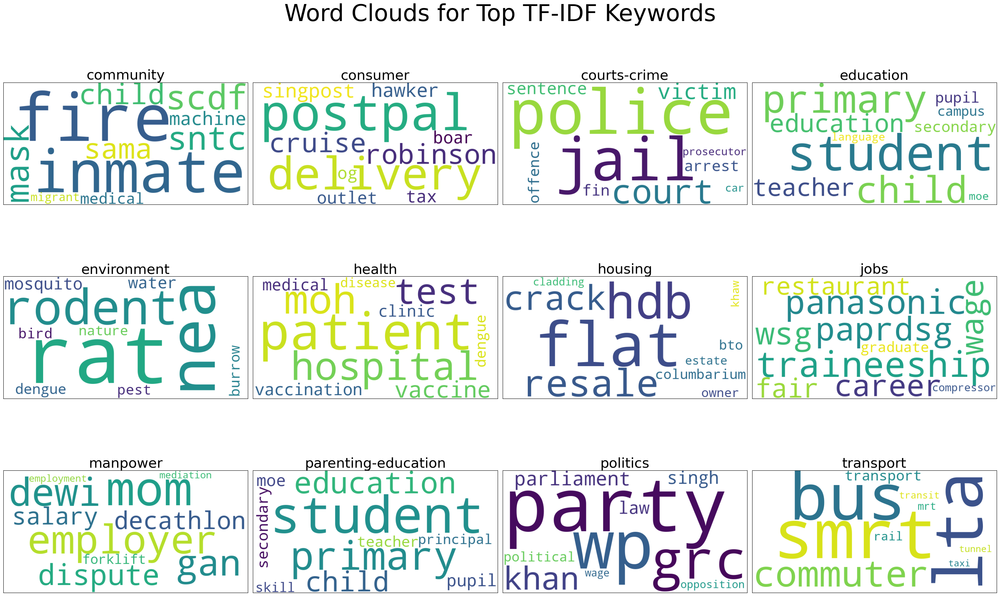

In [25]:
fig, axes = plt.subplots(len(top_tfidf_keywords_category) // 4, 4, figsize=(30, 20))

for i, ax in enumerate(axes.flat):
    if i < len(top_tfidf_keywords_category):
        word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_tfidf_keywords_category.loc[i, 'Top TF-IDF Keywords'])
        ax.imshow(word_cloud, interpolation='bilinear')
        ax.set_title(top_tfidf_keywords_category.loc[i, 'Category'], fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Word Clouds for Top TF-IDF Keywords", fontsize=50)

plt.tight_layout();

**YAKE**

In [26]:
top_yake_keywords_category = pd.DataFrame(columns=['Category', 'Top YAKE Keywords'])

In [27]:
n = 10

for i, article in enumerate(category_words['Article Processed']):
    keywords_category = keyword_extractor.extract_keywords(category_words.loc[i, 'Article Processed'])
    yake_dict_category = {}
    for keyword, score in keywords_category[::-1][:n]:
        yake_dict_category[keyword] = score
    top_yake_keywords_category = pd.concat([top_yake_keywords_category, pd.DataFrame({'Category': [category_words.iloc[i]['Category']], 'Top YAKE Keywords': [yake_dict_category]})]).reset_index(drop=True)

In [28]:
top_yake_keywords_category

,Category,Top YAKE Keywords
0,community,"{'social': 0.000745637820899155, 'day': 0.0007..."
1,consumer,"{'customer': 0.0009837569734437279, 'centre': ..."
2,courts-crime,"{'month': 1.412050569184502e-05, 'officer': 1...."
3,education,"{'secondary': 0.00017602808862262197, 'time': ..."
4,environment,"{'agency': 0.0001783363201565158, 'water': 0.0..."
5,health,"{'people': 9.60671047878143e-05, 'care': 8.872..."
6,housing,"{'room': 0.00033711252601038486, 'project': 0...."
7,jobs,"{'woman': 0.00206497356826804, 'time': 0.00203..."
8,manpower,"{'work': 0.002914775447005279, 'manpower': 0.0..."
9,parenting-education,"{'time': 0.0008643881955773045, 'work': 0.0006..."


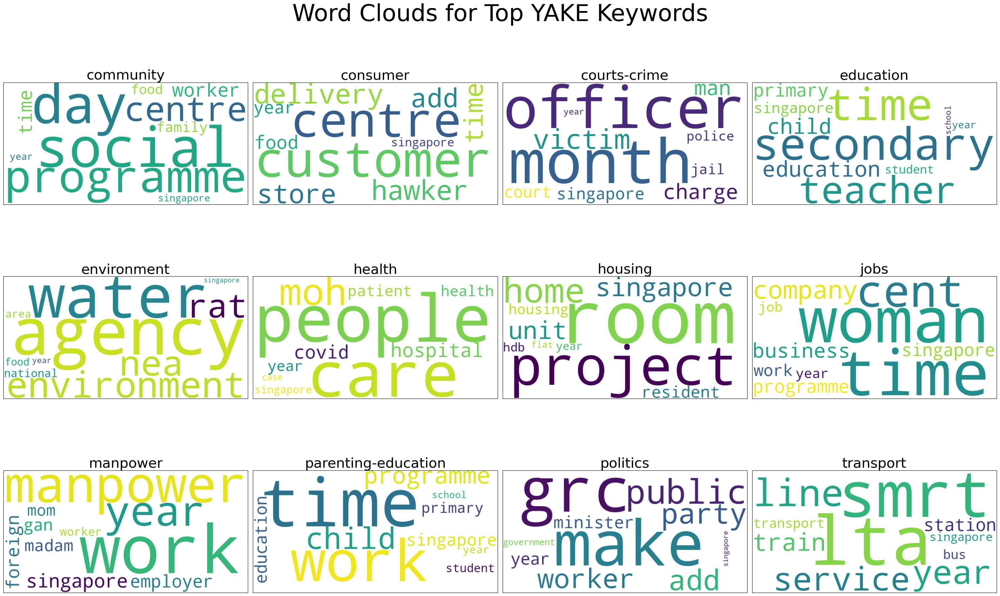

In [29]:
fig, axes = plt.subplots(len(top_yake_keywords_category) // 4, 4, figsize=(30, 20))

for i, ax in enumerate(axes.flat):
    if i < len(top_yake_keywords_category):
        word_cloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_yake_keywords_category.loc[i, 'Top YAKE Keywords'])
        ax.imshow(word_cloud, interpolation='bilinear')
        ax.set_title(top_yake_keywords_category.loc[i, 'Category'], fontsize=30)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Word Clouds for Top YAKE Keywords", fontsize=50)

plt.tight_layout();